# 1. Introduction
Team Members: Athina Cordero, Thomas Cruz, Arash (Philip) Mirian<br>
<br> <br> 
In the wake of the COVID-19 pandemic, medical facilities have been overloaded with patients with a variety of symptoms awaiting diagnosis. In an increasingly online world, individuals flock to websites such as WebMD to self-diagnose, which can lead to misleading results and widespread panic. In <a href="https://www.bmj.com/content/351/bmj.h3480">a recent study</a> published in the British Medical Journal (BMJ), we can see that in many cases these existing classification tools are mostly inaccurate. The 23 symptom checkers from the study provided the correct diagnosis as the first result only 34% of the time. The correct diagnosis was in the top 20 predicted prognoses in only 58% of evaluations. This BMJ study shows us that there is much room for improvement.
<br> <br> 
This study will perform a comparative analysis of three different classification methods: Decision Tree Classification, Multiclass Support Vector Machines, and Artificial Neural Networks. We will be comparing the accuracy, precision, recall, and F1-score of these supervised learning algorithms in their effectiveness in obtaining predictions of disease prognosis based on symptom input. It will be important to take into account all four scores of each method to ensure that there is minimal bias and variance. A more in depth description of each classifier can be found in Section 3b of this report.
The input variables for each method will be the same: a 0 or a 1 for up to 16 symptoms per disease. There are a total of 135 symptoms accounted for in the data. 

# 2. Related Work
There already exists a <a href="https://github.com/KarthikUdyawar/PredictIt/blob/master/myproject/ml.py">solution</a> for this problem on kaggle using a decision tree classifier. This solution uses the SciKit Learn built in Decision Tree Classifier, taking the data given and putting it directly into the classifier after splitting it into 70% training and 30% testing data. The focus of the project linked is a basic solution with a minimally customized DecisionTreeClassifier, the project uses the default settings given by SciKit Learn.
<br><br> 
Additionally, there have been several studies comparing classification methods for the diagnosis of a singular disease. <a href="https://www.beei.org/index.php/EEI/article/view/1621/1228">This BEEI study</a> conducts a comparative analysis on the diagnosis of classification methods specifically for chronic kidney disease. The BEEI study compares the following algorithms: ZeroR Classifier, Support Vector Machine, Naiive Bayes, Tree-based, k-Nearest-Neighbor, and Classification Via Regression. The study concludes that for their dataset, Naiive Bayes performed the best, however acknowledged gaps in investigation of feature contexts.
<br>

# 3. Our Solution

## a. Description of the dataset
### i. Importing data  - Athina

The datasets given contain 6 files
- A mapping of disease to symptom (dataset.csv)
- A high level description of each disease (disease_description.csv)
- A mapping of symptom to severity which catalogs each symptom on a scale of 1 to 7 based on how detrimental it is to patients' health (symptom_severity.csv)
- A mapping of symptom to disease, already split for training and testing (Training.csv, Testing.csv)

The dataset covers a total of 135 symptoms and 42 diseases. In the mapping of disease to symptom, we see that a disease can manifest in a few different ways. In a sample slide below we can see that the Common cold has 9 different sets of symptoms.

In [1]:
import pandas as pd
import numpy as np
from sklearn import svm
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.tree import export_graphviz
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from pandas import read_csv
import csv
import cv2

# Import the os module
#import os
#Change the current working directory
#os.chdir('C:/Users/crutho/Documents/')


In [43]:
#Need to update python and install tensor flow for this to run
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

In [2]:
dataset = pd.read_csv('Predict Disease Symptom/dataset.csv')

dataset = dataset.iloc[dataset.isnull().sum(axis=1).mul(-1).argsort()]
dataset

,Disease,Symptom_0,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Symptom_6,Symptom_7,Symptom_8,Symptom_9,Symptom_10,Symptom_11,Symptom_12,Symptom_13,Symptom_14,Symptom_15,Symptom_16
247,Paralysis (brain hemorrhage),vomiting,weakness_of_one_body_side,altered_sensorium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
248,Paralysis (brain hemorrhage),vomiting,headache,altered_sensorium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
249,Paralysis (brain hemorrhage),vomiting,headache,weakness_of_one_body_side,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,Fungal infection,itching,skin_rash,dyschromic_patches,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
301,Urinary tract infection,bladder_discomfort,foul_smell_of urine,continuous_feel_of_urine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,Common Cold,continuous_sneezing,fatigue,cough,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
60,Common Cold,continuous_sneezing,chills,fatigue,cough,high_fever,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
282,Tuberculosis,chills,vomiting,fatigue,weight_loss,cough,high_fever,breathlessness,sweating,loss_of_appetite,mild_fever,yellowing_of_eyes,swelled_lymph_nodes,malaise,phlegm,chest_pain,blood_in_sputum,NaN
68,Common Cold,continuous_sneezing,chills,fatigue,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN


In [3]:

disease_description = pd.read_csv('Predict Disease Symptom/disease_description.csv')
disease_description.head()


,Disease,Symptom_Description
0,AIDS,Acquired immunodeficiency syndrome (AIDS) is a...
1,Acne,"Acne vulgaris is the formation of comedones, p..."
2,Alcoholic hepatitis,"Alcoholic hepatitis is a diseased, inflammator..."
3,Allergy,An allergy is an immune system response to a f...
4,Arthritis,Arthritis is the swelling and tenderness of on...


In [4]:
symptom_severity = pd.read_csv('Predict Disease Symptom/symptom_severity.csv')
symptom_severity.head()

,Symptom,Symptom_severity
0,abdominal_pain,4
1,abnormal_menstruation,6
2,acidity,3
3,acute_liver_failure,6
4,altered_sensorium,2


In [5]:
training_data = pd.read_csv('Predict Disease Symptom/Training.csv')
training_data.head()

,abdominal_pain,abnormal_menstruation,acidity,acute_liver_failure,altered_sensorium,anxiety,back_pain,belly_pain,blackheads,bladder_discomfort,...,watering_from_eyes,weakness_in_limbs,weakness_of_one_body_side,weight_gain,weight_loss,yellow_crust_ooze,yellow_urine,yellowing_of_eyes,yellowish_skin,prognosis
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS


In [6]:
#This is Data set was editted from training_data in excel so that each prognosis is represented by a number 1 - 42
training_1 = pd.read_csv('Predict Disease Symptom/Training1.csv')
training_1.head()

,abdominal_pain,abnormal_menstruation,acidity,acute_liver_failure,altered_sensorium,anxiety,back_pain,belly_pain,blackheads,bladder_discomfort,...,watering_from_eyes,weakness_in_limbs,weakness_of_one_body_side,weight_gain,weight_loss,yellow_crust_ooze,yellow_urine,yellowing_of_eyes,yellowish_skin,prognosis
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [7]:
testing_data = pd.read_csv('Predict Disease Symptom/Testing.csv')
testing_data.head()

,abdominal_pain,abnormal_menstruation,acidity,acute_liver_failure,altered_sensorium,anxiety,back_pain,belly_pain,blackheads,bladder_discomfort,...,watering_from_eyes,weakness_in_limbs,weakness_of_one_body_side,weight_gain,weight_loss,yellow_crust_ooze,yellow_urine,yellowing_of_eyes,yellowish_skin,prognosis
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,AIDS
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Acne
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,Alcoholic hepatitis
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,Allergy
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Arthritis


In [8]:
dataset.loc[dataset['Disease'] == 'Common Cold']

,Disease,Symptom_0,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Symptom_6,Symptom_7,Symptom_8,Symptom_9,Symptom_10,Symptom_11,Symptom_12,Symptom_13,Symptom_14,Symptom_15,Symptom_16
67,Common Cold,continuous_sneezing,chills,cough,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
66,Common Cold,chills,fatigue,cough,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
65,Common Cold,continuous_sneezing,chills,fatigue,cough,high_fever,headache,swelled_lymph_nodes,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
64,Common Cold,continuous_sneezing,chills,fatigue,cough,high_fever,headache,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
63,Common Cold,continuous_sneezing,chills,fatigue,cough,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
61,Common Cold,continuous_sneezing,fatigue,cough,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
60,Common Cold,continuous_sneezing,chills,fatigue,cough,high_fever,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
68,Common Cold,continuous_sneezing,chills,fatigue,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain,NaN
62,Common Cold,continuous_sneezing,chills,fatigue,cough,high_fever,headache,swelled_lymph_nodes,malaise,phlegm,throat_irritation,redness_of_eyes,sinus_pressure,runny_nose,congestion,chest_pain,loss_of_smell,muscle_pain


### ii. Count by Disease - Thomas
Here we create a data frame containing soley each disease name and the ammount of times it is detected.

In [9]:
df = pd.DataFrame(disease_description.loc[:,["Disease"]])
#dataset.groupby('Disease').size()
df['Count']=[5,5,8,5,6,7,6,10,8,9,9,10,9,6,6,5,7,5,5,9,9,7,10,9,6,9,9,8,6,9,8,10,7,5,7,7,9,7,9,9,5,8]
df

,Disease,Count
0,AIDS,5
1,Acne,5
2,Alcoholic hepatitis,8
3,Allergy,5
4,Arthritis,6
5,Bronchial Asthma,7
6,Cervical spondylosis,6
7,Chicken pox,10
8,Chronic cholestasis,8
9,Common Cold,9


### iii. Scatter Plot - Thomas
The Scatter Plot below creates a visualization of count vs disease.

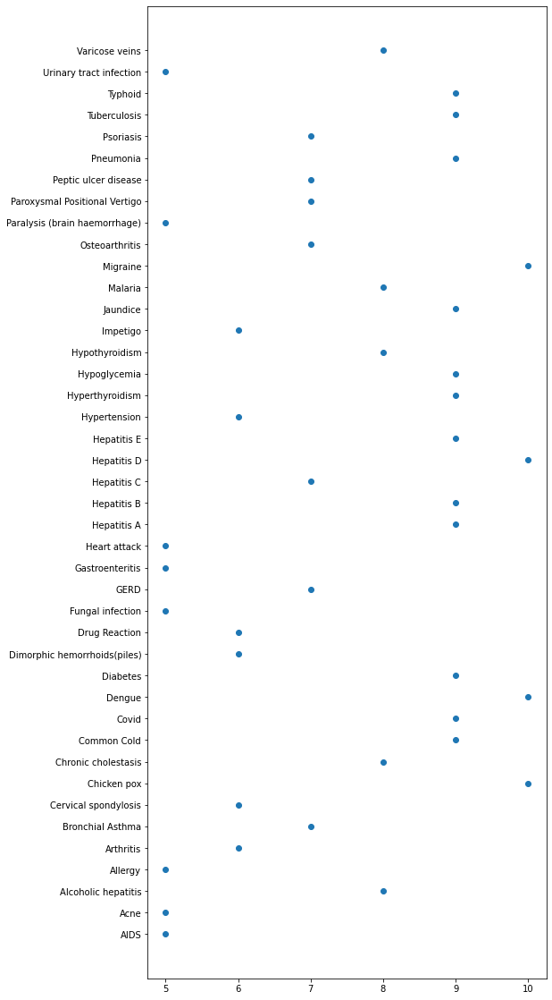

In [10]:
fig = plt.figure(figsize = (8,20))
plt.scatter(df['Count'],df['Disease'])

### iv. Principal Component Analysis - Thomas
PCA in this section will be used to reduce the dimensionality of the data set by transforming the variabals into smaller principal components. While reducing the dimensions and accuracy of the data set we are able to easily visualize, explore, and analyze this new transformation.

In [11]:
symptoms = training_data.iloc[:,:134]
prognosis=training_data.iloc[:,[134]]

In [12]:
#Normalize data
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(symptoms)
principalDf = pd.DataFrame(data=principalComponents)

finalDf = pd.concat([principalDf, prognosis], axis = 1)
finalDf = finalDf.rename(columns = {0:'principal component 1', 1:'principal component 2', 'prognosis':'target'})
finalDf

,principal component 1,principal component 2,target
0,-0.539336,-0.015994,AIDS
1,-0.529935,-0.014222,AIDS
2,-0.529935,-0.014222,AIDS
3,-0.726753,-0.350024,AIDS
4,-0.529935,-0.014222,AIDS
...,...,...,...
301,-0.840403,-0.385242,Varicose veins
302,-0.629603,-0.151376,Varicose veins
303,-0.629603,-0.151376,Varicose veins
304,-0.599460,-0.145710,Varicose veins


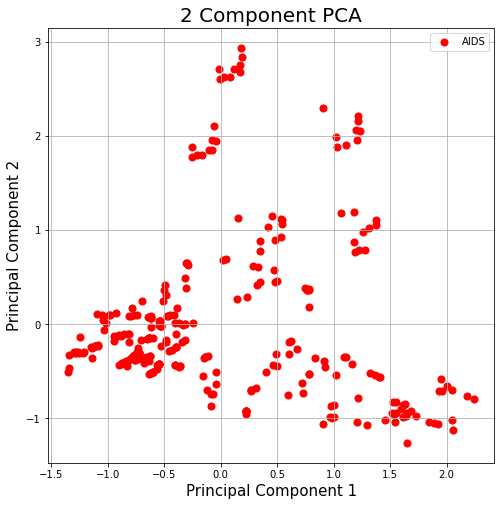

In [13]:
#Final submission will include top 3 count of disease
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)
targets = finalDf['target']
colors = ['r']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['target'] == targets
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'],
               finalDf.loc[indicesToKeep, 'principal component 2'],
               c = color,
               s = 50)
ax.legend(targets)
ax.grid()

<AxesSubplot:xlabel='principal component 1', ylabel='principal component 2'>

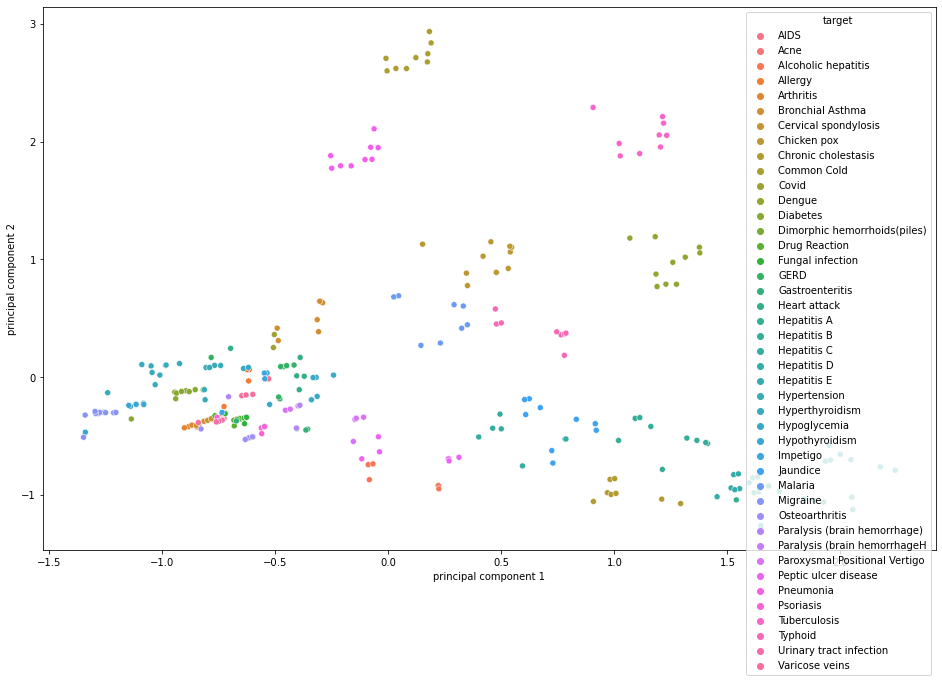

In [14]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="principal component 1", y="principal component 2",
    hue="target",
    data=finalDf,
    legend="full"
)


In [15]:
#The percentage of variance that is attributed by each of the components.
print(pca.explained_variance_ratio_[0])
print(pca.explained_variance_ratio_[1])

0.12461313023885193
0.11211475889344899


### v. Heat Map - Thomas

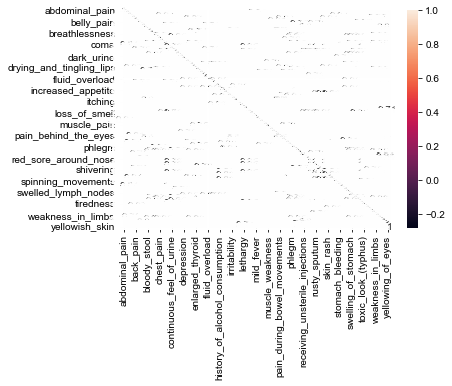

In [16]:
sns.heatmap(training_data.corr(),annot=True)

sns.set(rc = {'figure.figsize':(15,15)})

## b. Machine Learning Algorithms - Description

### i. Support Vector Machines Details - Athina
Support Vector Machines (SVM) is a classifier that partitions training data via hyperplanes. The algorithm finds the optimal separating hyperplane of N-dimensional space (where N is the number of features) by calculating the largest margin between points belonging to two or more categories. In a two dimensional dataset, SVM can be visually represented with a linear decision boundary cutting through the very center of the margin. For any new data point x, we can determine the category of x by calculating which side of the decision boundary that x falls in. <br>

There are several benefits to using SVM including that it is effective in high dimensional spaces even when the number of dimensions is greater than the number of samples. It is also memory efficient, since the trained model itself only needs to retain only the support vectors and not the entirety of the training data.  A major disadvantage of SVM is that it is very sensitive to noise and overlapping classes. SVM is also susceptible to over-fitting, which can be avoided by choosing the best Kernel function and regularization parameters. 

### ii. Neural Networks - Thomas
Neural Networks is a machine learning algorithm that is used to make predictions. The algorithm puts an input layer or layers into nodes, each of which made into linear regression models and produce an output or prediction. The target or prediction in with this data set will be the disease and the inputs will be each of the symptoms. One or many symptoms will contribute to nodes which then predict diseases. 

In the parameters of this problem, we may find that continuing to add layers (symptoms) may have no effect because each layer will have some correlation with the input of the previous layer. i.e. A disease may be predictable after the first 3 symptoms so including additional layers will still produce the same result.

### i. Decision Trees - Arash
<p>The decision tree is one of the algorithms used in analyzing our dataset. This is a hierarchal appearing graph with nodes connected by edges. At each node a question is asked, and the edge is the response. This may continue to branch until a leaf or terminal node is reached representing the output or, in our case, the class. This supervised algorithm may be used for both classification and regression problems with the goal of predicting the class or value of the target variable. <p>To distinguish the root node and sub-nodes or decision nodes, the two most common mathematical techniques rely on gini impurity or entropy and information gain. Notably this is for the C4.5 algorithm to differentiate from the CART, CHAID and MARS algorithms. This is a recursive algorithm proceeding until all attributes are covered. Thus, this algorithm tends to create overfitting because it does a good job at classifying the data at each and every example. When this occurs it prevents the ability to generalize the use of the alrgorithm. Therefore, it is common to prune the tree or tune the hyperparameters. <p>This algorithm may be particularly useful as we may be able to define pathways to specific diseases using this type of classification hierarchy. With our dataset of existing diseases and their corresponding symptoms, we can train a decision tree algorithm. We anticipate this algorithm will be able to use and distinguish between each unique and overlapping symptom fed into the system to provide a corresponding disease with sufficient accuracy to allow us to generalize it’s use. 


## c. Machine Learning Algorithms - Implementation

### ii. SVM Implementation V1 - Athina

In [17]:
from sklearn.metrics import make_scorer
import warnings
warnings.filterwarnings('ignore')

param_grid = [
  {
      'C': [1, 10, 100, 1000], 
      'kernel': ['poly'], 
      'degree':[2,3,4,5,6],
      'decision_function_shape': ['ovo','ovr']
  },
  {
      'C': [1, 10, 100, 1000], 
      'gamma': [0.001, 0.0001], 
      'kernel': ['rbf'], 
      'decision_function_shape': ['ovo','ovr']
  }
 ]

gs = GridSearchCV(
    svm.SVC(random_state=42),
    param_grid=param_grid,
    refit="AUC",
    n_jobs=2,
    return_train_score=True,
)

training_x = training_data.drop(['prognosis'], axis=1)
training_y = training_data['prognosis']
gs.fit(training_x, training_y)


GridSearchCV(estimator=SVC(random_state=42), n_jobs=2,
             param_grid=[{'C': [1, 10, 100, 1000],
                          'decision_function_shape': ['ovo', 'ovr'],
                          'degree': [2, 3, 4, 5, 6], 'kernel': ['poly']},
                         {'C': [1, 10, 100, 1000],
                          'decision_function_shape': ['ovo', 'ovr'],
                          'gamma': [0.001, 0.0001], 'kernel': ['rbf']}],
             refit='AUC', return_train_score=True)

In [18]:
gs.best_estimator_

SVC(C=10, decision_function_shape='ovo', degree=2, kernel='poly',
    random_state=42)

In [19]:
poly = svm.SVC(kernel='poly', degree=2, C=10, decision_function_shape='ovo').fit(training_x, training_y)

In [20]:
testing_x = testing_data.drop(['prognosis'], axis=1)
testing_y = testing_data['prognosis']

In [21]:
poly_pred = poly.predict(testing_x)

In [22]:
poly_accuracy = accuracy_score(testing_y, poly_pred)
poly_f1 = f1_score(testing_y, poly_pred, average='weighted')
print('Accuracy (Polynomial Kernel): ', "%.2f" % (poly_accuracy*100))
print('F1 (Polynomial Kernel): ', "%.2f" % (poly_f1*100))

Accuracy (Polynomial Kernel):  100.00
F1 (Polynomial Kernel):  100.00


### ii. Neural Network - Thomas

In [23]:
#Changing pandas dataframe to numpy array
X = training_1.iloc[:,:134].values
y = training_1.iloc[:,134:135].values
print(X.shape)
print(y.shape)

(306, 134)
(306, 1)


In [24]:
#Normalizing the data
sc = StandardScaler()
X = sc.fit_transform(X)

In [25]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
y = ohe.fit_transform(y).toarray()

In [26]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.1)

In [27]:
#Dependencies
import keras
from keras.models import Sequential
from keras.layers import Dense
# Neural network
model = Sequential()
model.add(Dense(16, input_dim=134, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(42, activation='softmax'))

In [28]:
model.compile(loss='MeanSquaredError', optimizer='adam', metrics=['accuracy'])

In [29]:
history = model.fit(X_train, y_train, epochs=100, batch_size=64)

Epoch 1/100
5/5 [==============================] - 1s 3ms/step - loss: 0.0233 - accuracy: 0.0364
Epoch 2/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0232 - accuracy: 0.0582
Epoch 3/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0231 - accuracy: 0.0909
Epoch 4/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0230 - accuracy: 0.1055
Epoch 5/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0229 - accuracy: 0.1236
Epoch 6/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0227 - accuracy: 0.1527
Epoch 7/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 0.1782
Epoch 8/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 0.2000
Epoch 9/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0220 - accuracy: 0.2182
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0216 - accuracy: 0.2145
Epoch 11/100
5/5 [===========

In [30]:
y_pred = model.predict(X_test)
#Converting predictions to label
pred = list()
for i in range(len(y_pred)):
    pred.append(np.argmax(y_pred[i]))
#Converting one hot encoded test label to label
test = list()
for i in range(len(y_test)):
    test.append(np.argmax(y_test[i]))
    

1/1 [==============================] - 0s 102ms/step


In [31]:
a = accuracy_score(pred,test)
print('Accuracy is:', a*100)

Accuracy is: 93.54838709677419


In [32]:
history = model.fit(X_train, y_train,validation_data = (X_test,y_test), epochs=100, batch_size=64)

Epoch 1/100
5/5 [==============================] - 0s 47ms/step - loss: 8.1963e-04 - accuracy: 0.9709 - val_loss: 0.0020 - val_accuracy: 0.9355
Epoch 2/100
5/5 [==============================] - 0s 8ms/step - loss: 8.0075e-04 - accuracy: 0.9745 - val_loss: 0.0020 - val_accuracy: 0.9355
Epoch 3/100
5/5 [==============================] - 0s 8ms/step - loss: 7.7795e-04 - accuracy: 0.9745 - val_loss: 0.0019 - val_accuracy: 0.9355
Epoch 4/100
5/5 [==============================] - 0s 8ms/step - loss: 7.5640e-04 - accuracy: 0.9745 - val_loss: 0.0019 - val_accuracy: 0.9355
Epoch 5/100
5/5 [==============================] - 0s 9ms/step - loss: 7.3351e-04 - accuracy: 0.9782 - val_loss: 0.0019 - val_accuracy: 0.9355
Epoch 6/100
5/5 [==============================] - 0s 8ms/step - loss: 7.1963e-04 - accuracy: 0.9818 - val_loss: 0.0019 - val_accuracy: 0.9355
Epoch 7/100
5/5 [==============================] - 0s 8ms/step - loss: 6.9701e-04 - accuracy: 0.9855 - val_loss: 0.0019 - val_accuracy: 0.935

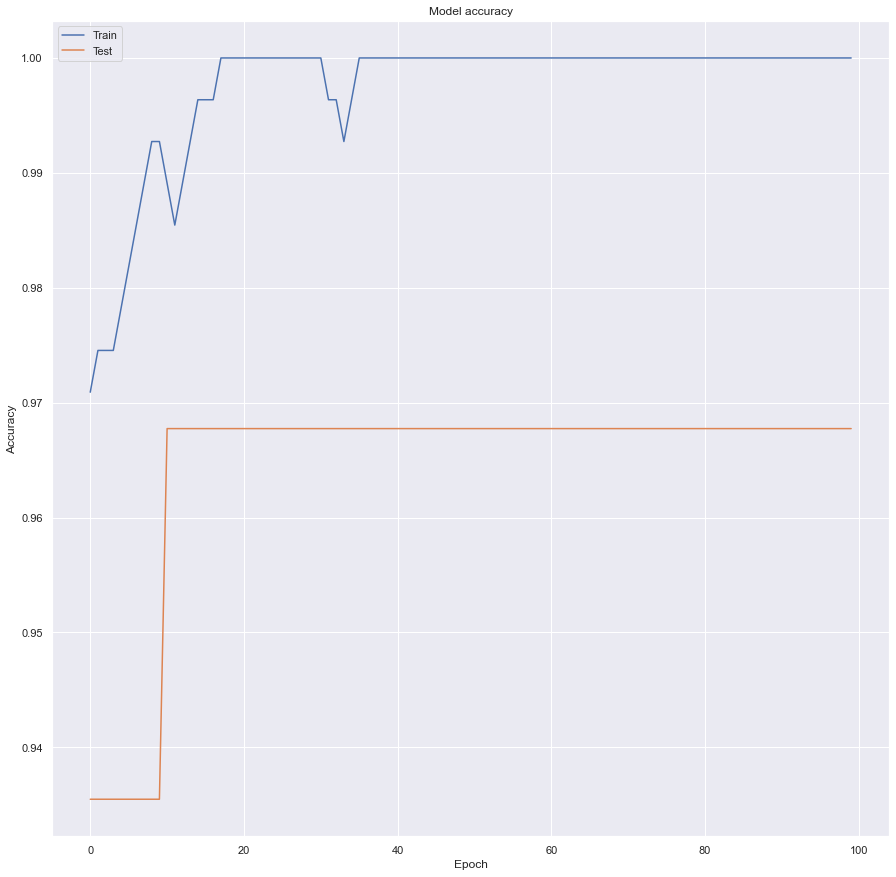

In [33]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

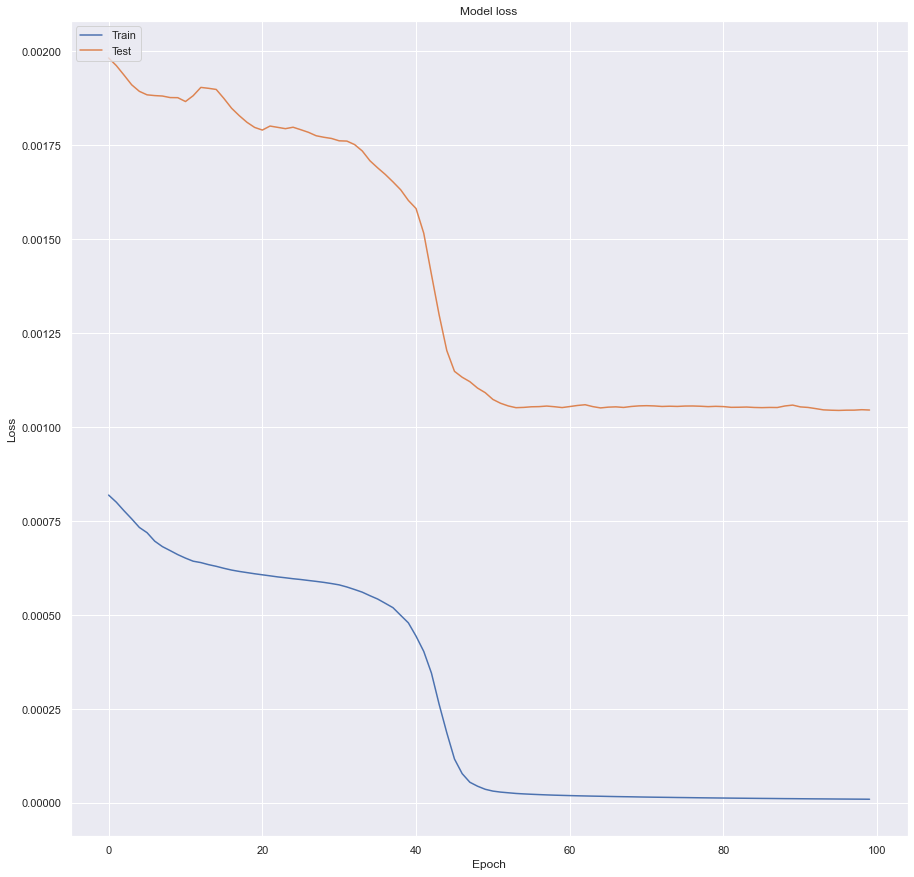

In [34]:
plt.plot(history.history['loss']) 
plt.plot(history.history['val_loss']) 
plt.title('Model loss') 
plt.ylabel('Loss') 
plt.xlabel('Epoch') 
plt.legend(['Train', 'Test'], loc='upper left') 
plt.show()

### iii. Decision Tree - Implementation Details  - Arash

To begin this algorithm we first start by loading the appropriate libraries and perfrom required pre-processing. Notably, our dataset did not require any processing. Rather, some diseases had more corresponding symptoms than others creating Null cells. Because we are performing this algorithm on categorical data, we will need to create "dummy" variables. Therefore, these Null cells were turned into strings called "unkown" to ensure they are of the same data type as the features.  

In [10]:
#importing libraries and dataset
filename = 'dataset.csv'
data = pd.read_csv(filename)

In [45]:
#Missing information filled in with the string "Unknown"
data.fillna('unknown')

,Disease,Symptom_0,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Symptom_6,Symptom_7,Symptom_8,Symptom_9,Symptom_10,Symptom_11,Symptom_12,Symptom_13,Symptom_14,Symptom_15,Symptom_16
0,AIDS,muscle_wasting,patches_in_throat,high_fever,extra_marital_contacts,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
1,AIDS,patches_in_throat,high_fever,extra_marital_contacts,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
2,AIDS,muscle_wasting,high_fever,extra_marital_contacts,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
3,AIDS,muscle_wasting,patches_in_throat,extra_marital_contacts,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
4,AIDS,muscle_wasting,patches_in_throat,high_fever,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,Varicose veins,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,prominent_veins_on_calf,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
309,Varicose veins,fatigue,cramps,bruising,obesity,swollen_legs,swollen_blood_vessels,prominent_veins_on_calf,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
310,Varicose veins,fatigue,cramps,bruising,obesity,swollen_legs,prominent_veins_on_calf,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown
311,Varicose veins,fatigue,cramps,bruising,swollen_legs,swollen_blood_vessels,prominent_veins_on_calf,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown


In [46]:
#Turning target categorical data into dummies
dummy_data_target = pd.get_dummies(data, columns = ['Disease'])
dummy_data_target.drop(["Symptom_0","Symptom_1","Symptom_2","Symptom_3","Symptom_4","Symptom_5","Symptom_6","Symptom_7","Symptom_8","Symptom_9","Symptom_10","Symptom_11","Symptom_12","Symptom_13","Symptom_14","Symptom_15","Symptom_16"], axis = 1, inplace = True)
dummy_data_target.head(50)

,Disease_AIDS,Disease_Acne,Disease_Alcoholic hepatitis,Disease_Allergy,Disease_Arthritis,Disease_Bronchial Asthma,Disease_Cervical spondylosis,Disease_Chicken pox,Disease_Chronic cholestasis,Disease_Common Cold,...,Disease_Osteoarthritis,Disease_Paralysis (brain hemorrhage),Disease_Paroxysmal Positional Vertigo,Disease_Peptic ulcer disease,Disease_Pneumonia,Disease_Psoriasis,Disease_Tuberculosis,Disease_Typhoid,Disease_Urinary tract infection,Disease_Varicose veins
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
#Turning feature categorical data into dummies
dummy_data_features = pd.get_dummies(data, columns = ["Symptom_0","Symptom_1","Symptom_2","Symptom_3","Symptom_4","Symptom_5","Symptom_6","Symptom_7","Symptom_8","Symptom_9","Symptom_10","Symptom_11","Symptom_12","Symptom_13","Symptom_14","Symptom_15","Symptom_16"])
dummy_data_features.drop('Disease', axis=1, inplace = True)
dummy_data_features.head()

,Symptom_0_ acidity,Symptom_0_ back_pain,Symptom_0_ bladder_discomfort,Symptom_0_ breathlessness,Symptom_0_ burning_micturition,Symptom_0_ chest_pain,Symptom_0_ chills,Symptom_0_ constipation,Symptom_0_ continuous_sneezing,Symptom_0_ cough,...,Symptom_13_ congestion,Symptom_13_ phlegm,Symptom_13_ red_spots_over_body,Symptom_14_ blood_in_sputum,Symptom_14_ chest_pain,Symptom_14_ loss_of_smell,Symptom_15_ blood_in_sputum,Symptom_15_ loss_of_smell,Symptom_15_ muscle_pain,Symptom_16_ muscle_pain
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


From here we split the data into test/train and fit it to our preliminary decision tree classifier.

In [15]:
#Splitting data into test train using 80% for training and 20% for testing
x = dummy_data_features
y = dummy_data_target
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = .80)

In [16]:
#Fitting data to a dicision tree classifier
tree_clf = DecisionTreeClassifier(max_depth=10)
tree_clf.fit(x, y)

DecisionTreeClassifier(max_depth=10)

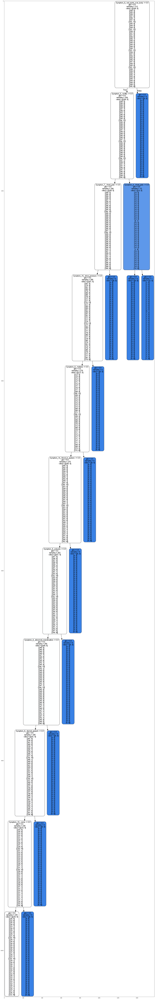

In [21]:
#Graphing the decision tree
export_graphviz(tree_clf, 
                out_file='tree.dot', 
                    feature_names = x_train.columns,
                rounded = True, proportion = False, 
                precision = 1, filled = True)
! dot -Tpng tree.dot -o tree.png
%matplotlib inline
img = cv2.imread('tree.png')
plt.figure(figsize = (250, 200))
plt.imshow(img)

In [22]:
#Accuracy of the above tree
predictions = tree_clf.predict(x_test)
print("Accuracy:", accuracy_score(y_test, predictions))

Accuracy: 0.2857142857142857


When fitting all the data without pruning or tuning we see we do not get a very good accuracy. This is very likely a result of overfitting. Therefore, we will tune the hyperparameters to see if we are able to improve the accuracy of the algorithm. 

In [25]:
#Using GridSearchCV() to identify the optimal parameters
tree_params = {'criterion':['gini','entropy'],'max_depth':[1,2,3,4,5,6,7,8,9,10], 'max_leaf_nodes': list(range(2, 100)), 'max_features': [None, 'sqrt', 'log2', 0.2, 0.4, 0.6, 0.8], 'splitter': ['best','random']}
tuning_tree_GS_clf = GridSearchCV(DecisionTreeClassifier(),tree_params,cv=5)
tuning_tree_GS_clf.fit(x,y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'max_features': [None, 'sqrt', 'log2', 0.2, 0.4, 0.6,
                                          0.8],
                         'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                            13, 14, 15, 16, 17, 18, 19, 20, 21,
                                            22, 23, 24, 25, 26, 27, 28, 29, 30,
                                            31, ...],
                         'splitter': ['best', 'random']})

In [26]:
tuning_tree_GS_clf.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'log2',
 'max_leaf_nodes': 51,
 'splitter': 'random'}

In [67]:
tree_clf_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=10, max_leaf_nodes = 85, splitter = 'best')
tree_clf_pruned = tree_clf_pruned.fit(x, y)

In [68]:
export_graphviz(tree_clf_pruned, 
                out_file='tree.dot', 
                    feature_names = x_train.columns,
                rounded = True, proportion = False, 
                precision = 1, filled = True)
! dot -Tpng tree.dot -o tree.png
%matplotlib inline
img = cv2.imread('tree.png')
plt.figure(figsize = (250, 200))
plt.imshow(img)

In [69]:
pruned_predictions = tree_clf_pruned.predict(x_test)
print("Accuracy:", accuracy_score(y_test, pruned_predictions))

Accuracy: 0.7301587301587301


After pruning and tuning we see decision tree appears very different. It appears to give us more dynamic pathways that are more distinct and in fact gives a much improved accuracy! However, this is not sufficient to use for generalized purposes. Perhaps we can make another attempt to improve the algorithm by running it with multiple sub-samples and average each of the outputs. This is another attempt to reduce overfitting.

In [74]:
forest_clf=RandomForestClassifier(n_estimators=60)

In [75]:
def disease_accuracy():
    forest_clf.fit(x_train,y_train)
    y_pred_forest=forest_clf.predict(x_test)
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred_forest))

disease_accuracy()

Accuracy: 0.7777777777777778


Alas, we see there is further improvement approaching a more generalizable algorithm that may be able to assist healthcare providers in making quick diagnosable dicisions based on symptomatology. 

## Comparison - Arash<p>
As we look at the algorithms we can see they are listed in order of their accuracy. SVM is demonstrating a 100% followed by the neural network at 93% and the decision tree at just over 70%. The algorithms we used are those seen commonly within the literature (Uddin et al., Park et al.). Further, based on the literature we have used some of the most common techniques with similar outcomes (Ibrahim et al.). It does appear that the outcomes are dependent on the type of dataset, so we can see our algorithms provide different accuracy than what is seen from data sets such as cancer, kidney disease, heart disease or asthma. It is here we must mention we used one technique at a time in an effort to discover diagnosis of many different diseases. The literature however, makes use of many algorithms to determine which best predicts disease states for one diagnosis (Uddin et al.). <p> Some comments on our algorithms. First, it may be wise to heed anything that may predict 100% of the time. Overall, SVM is difficulty to interpret because we are unable to obtain specific probabilities of which symptoms belongs to which disease. Further, this algorithm states it was able to linearly separate all data with a second degree polynomial. This seems low for the number of overlapping symptoms that exist between diseases. This overlapping symptoms issues may also be the reason why the decision tree and random forest did not perform so well. The literature demonstrates that the random forest classifier tends to be one of the better ML algorithms for disease prediction as exampled by Spino et al for heart disease prediction and related articles. Our outcomes may be a function of hyperparameter tuning as the GridSearchCV function may be impractical due to the exponential computing required to address 5 parameters. <p> Lastly, our sequential neural network performed very well and maybe this makes sense. That is, if we can understand that typically a disease state has more than one symptom. These symptoms are necessarily dependent on each other as a whole to determine said disease state. Despite having overlapping symptoms once we sequentially add each symptom, this algorithm may "remember" the prior input to influence the current input and output. In this way some deterministic combination of symptoms will inform proper biases to minimze the cost function. 


# 4. Future directions - Athina and Arash 

Given 6-12 more months, this study could be expanded further. First, the team could gather additional datasets to provide additional complexity to our algorithms. Disease symptoms can be specific to individual based on factors such as age, lifestyle, blood type, and various genetic factors. In an ideal scenario, we would hope to build algorithms resilient enough to handle symptom differences and still arrive to the proper result. The dataset used in this study was at a high level and does not contain information on specific strains and or severity of diseases. These differences in disease states can cause slightly different symptoms, therefore additional datasets used would need to include symptoms from several variants of a disease.</br>

Additionally, current medical practice uses symptoms as screen to inform further testing and imaging. If the capacity to add imaging could be obtained, we may consider using convolutional neural networks to improve our diagnostic ability. <br>

Furthermore, the team could explore the use of Classifier Fusion or Ensemble techniques to combine multiple classifiers to achieve the most accurate result. With the extra time, we could determine the ideal combination and weights of the classifying algorithms to determine prognosis. With classifier fusion, we could remove bias introduced in specific algorithms and avoid overfitting to our dataset. 

# 5. Conclusion - Arash<p>
   Again, we had compared how well time series neural network, decision tree and support vector machine algorithms perform in predicting disease states from symptoms alone. For our specific data it appears the SVM model performs the best of the three at 100% accuracy. This may come with caution as our model used a second degree polynomial kernel to be able to separate several overlapping symptoms. This does not seem likely nor does SVM provide any probability that a symptom may belong to one cluster of symptoms to a specific disease as compared to another making this difficult to interpret. It is best to say we may not have fully discovered a model to to be as predictive as would be necessary to use clinically. However, in this project we did use common models that have been seen within the literature, however each data set is different. Other common models include KNN, logistic regression, K-means, Naïve Bayes and multi-layer perceptron that we could look towards using in the future. 

# 6. References

1. SciKit Learn - https://scikit-learn.org/stable/
2. British Medical Journal (BMJ) Article - https://www.bmj.com/content/351/bmj.h3480
3. Existing solution from Kaggle - https://github.com/KarthikUdyawar/PredictIt/blob/master/myproject/ml.py
4. Comparative analysis of classification algorithms for chronic kidney disease diagnosis - https://www.beei.org/index.php/EEI/article/view/1621/1228
5. Predict Disease Symptom Dataset - https://www.kaggle.com/datasets/karthikudyawar/disease-symptom-prediction
6. Ibrahim, I., &amp; Abdulazeez, A. (2021). The role of machine learning algorithms for diagnosing diseases. Journal of Applied Science and Technology Trends, 2(01), 10–19. https://doi.org/10.38094/jastt20179 
7. Anishfathima, B., Vikram, R., T, S. R., Sri Vishnu, M., &amp; Venumadhav, C. (2022). A comparative analysis on classification models to predict cardio-vascular disease using machine learning algorithms. 2022 Second International Conference on Artificial Intelligence and Smart Energy (ICAIS). https://doi.org/10.1109/icais53314.2022.9741831 
8. Park, J., &amp; Edington, D. W. (2001). A sequential neural network model for diabetes prediction. Artificial Intelligence in Medicine, 23(3), 277–293. https://doi.org/10.1016/s0933-3657(01)00086-0 
9. Uddin, S., Khan, A., Hossain, M. E., &amp; Moni, M. A. (2019). Comparing different supervised machine learning algorithms for disease prediction. BMC Medical Informatics and Decision Making, 19(1). https://doi.org/10.1186/s12911-019-1004-8 
10. Spino, S., Sathik, M. M., &amp; Nisha, S. S. (2019). Prediction of Heart Disease using Decision Tree Classification Algorithms. SSRG International Journal of Computer Science and Engineering, 18–22. Retrieved August 21, 2022, from https://www.internationaljournalssrg.org/uploads/specialissuepdf/ICRTETM-2019/2019/CSE/IJCSE-ICRTETM-P105.pdf. 